In [ ]:

import scanpy as sc
import pandas as pd
import numpy as np
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
rcParams['figure.figsize'] = (7,7)
import seaborn as sns

In [2]:
import muon as mu

# Import a module with ATAC-seq-related functions
from muon import atac as ac

2023-04-16 18:43:31.401975: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [138]:
sample_color_dic = {'lib_09': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 'lib_10': (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 'lib_15': (1.0, 0.4980392156862745, 0.054901960784313725),
 'lib_23': (1.0, 0.7333333333333333, 0.47058823529411764),
 'lib_29': (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 'lib_34': (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 'lib_36': (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 'lib_38': (1.0, 0.596078431372549, 0.5882352941176471),
 'lib_51': (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 'lib_54': (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 'lib_55': (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 'lib_56': (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 'lib_57': (0.8901960784313725, 0.4666666666666667, 0.7607843137254902)}
def comparison_heatmap(adata, key1, key2, label_1=None, label_2=None, cmap = 'Reds', annot = True, figsize=('7', '7')):
    if label_1==None:
        label_1=key1
    if label_2==None:
        label_2=key2
    expected_df = adata.obs[[key1,key2]].groupby(by=[key2,key1]).size().reset_index(name = 'count')
    counts = np.array(expected_df['count'].tolist())
    df = pd.DataFrame(counts.reshape(((len(adata.obs[key2].cat.categories),len(adata.obs[key1].cat.categories)))), index = expected_df[key2].unique(), columns = expected_df[key1].unique())
    if annot ==True:
        annot_ = df.astype(int)
        sc.settings.set_figure_params(figsize=figsize)
    else:
        annot_=None
        sc.settings.set_figure_params(figsize=figsize, color_map='gist_earth')
    s = sns.heatmap(df/np.sum(df,axis = 0), cbar_kws={'label': '% cell shared between annotations'}, cmap=cmap, vmax=1, vmin=0, annot = annot_,  fmt='.7g')
    s.set_ylabel(label_2, fontsize=12)
    s.set_xlabel(label_1, fontsize = 12)
    return df
def n_cells_histogram(adata, sample_key='sample', sample_color_dic = sample_color_dic):
    df = pd.DataFrame(adata.obs[sample_key].value_counts().index, index = adata.obs[sample_key].value_counts().index  , columns =[ sample_key ])
    df['n_cells'] = adata.obs[sample_key].value_counts().values.astype(int)
    df.reindex(index=np.argsort(df['n_cells']).index.tolist()[::-1]).plot(kind='bar', x = sample_key, y ='n_cells', color = [sample_color_dic[i] for i in np.argsort(df['n_cells']).index.tolist()[::-1]], title = 'Total nº of Cells' )

In [6]:
sc.settings.set_figure_params(dpi=80, color_map='gist_earth')
sc.settings.set_figure_params(figsize=('15', '10'), color_map='gist_earth')

In [ ]:
palette = { 'PT':'#ff9896',
 'PT_VCAM1':'#c5b0d5',
 'TL':'#279e68',
 'TAL':'#c49c94',
 'DCT1':'#ff7f0e',
 'CNT':'#1f77b4',
 'PC':'#aec7e8',
 'DCT2':'#279e68',
 'ENDO':'#d62728',
 'MES':'#17becf',
 'FIB':'#aa40fc',
 'ICA':'#8c564b',
 'ICB':'#e377c2',
 'PODO':'#98df8a',
 'PEC':'#ffbb78',
 'LEUK':'#b5bd61'
          }

#### Now we load GA Deepscore annotation

In [13]:
adata.obs['predicted.id'] = adata.obs['Deepscore_markers_GA']
adata.obs['barcode'] = adata.obs.index

In [ ]:
adata.X = adata.layers['counts']
ac.pp.tfidf(adata, scale_factor=1e4)

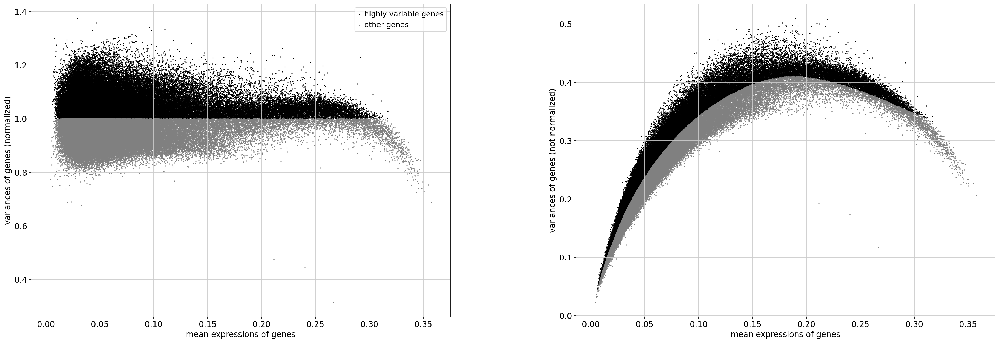

In [17]:
sc.pp.highly_variable_genes(adata, n_top_genes = 80000, flavor='seurat_v3')
sc.pl.highly_variable_genes(adata)

In [20]:
atac = adata

In [21]:
ac.tl.lsi(atac)
atac.obsm['X_lsi'] = atac.obsm['X_lsi'][:,1:]
atac.varm["LSI"] = atac.varm["LSI"][:,1:]
atac.uns["lsi"]["stdev"] = atac.uns["lsi"]["stdev"][1:]

## Clustering w/out Batch Effect

In [22]:
import harmonypy as hm
ho = hm.run_harmony(atac.obsm['X_lsi'], atac.obs, 'sample')


2023-04-16 18:56:49,572 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-04-16 18:56:57,977 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-04-16 18:56:58,327 - harmonypy - INFO - Iteration 1 of 10
2023-04-16 18:57:33,358 - harmonypy - INFO - Iteration 2 of 10
2023-04-16 18:58:07,370 - harmonypy - INFO - Converged after 2 iterations


In [23]:
harmonized = pd.DataFrame(ho.Z_corr.T, index = atac.obs.index)
harmonized.head(1)

,0,1,2,3,4,5,6,7,8,9,...,39,40,41,42,43,44,45,46,47,48
index,,,,,,,,,,,,,,,,,,,,,
AAACAGCCAACACCTA-3,-1.153008,-0.170646,0.139526,-0.487442,-0.03555,-1.273153,-0.760249,0.456717,0.260453,-0.051301,...,0.101596,0.010825,-0.161952,-0.30666,0.533312,-0.551632,-0.449878,0.191274,-0.232054,-0.571829


In [24]:
# Write the adjusted PCs to a new file.
atac.obsm['X_lsi_harmonized'] = harmonized.values


In [44]:
atac.obsm['X_pca'] = atac.obsm['X_lsi_harmonized']

In [61]:
sc.pp.neighbors(atac, use_rep="X_lsi_harmonized", n_neighbors=15)

In [58]:
sc.tl.leiden(atac, resolution=.8)

In [62]:
sc.tl.umap(atac, spread=1.5, min_dist=.5, random_state=20)

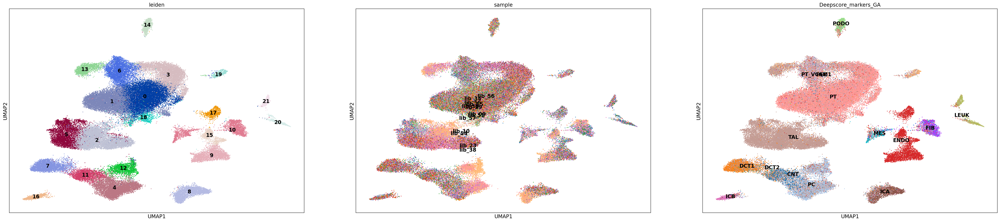

In [63]:
sc.pl.umap(atac, color=["leiden","sample",'Deepscore_markers_GA'], legend_loc="on data", size = 15)

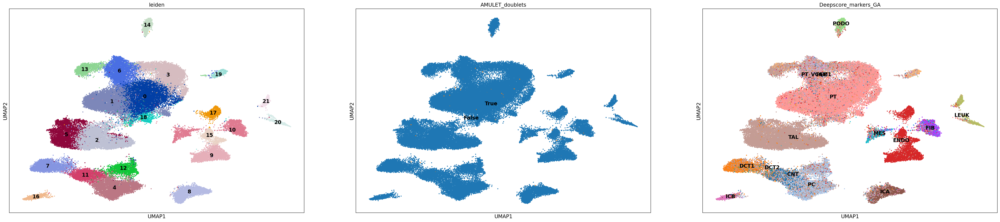

In [64]:
sc.pl.umap(adata, color=["leiden","AMULET_doublets",'Deepscore_markers_GA'], legend_loc="on data", size = 30)

In [103]:
sc.tl.leiden(adata, resolution=0.4)

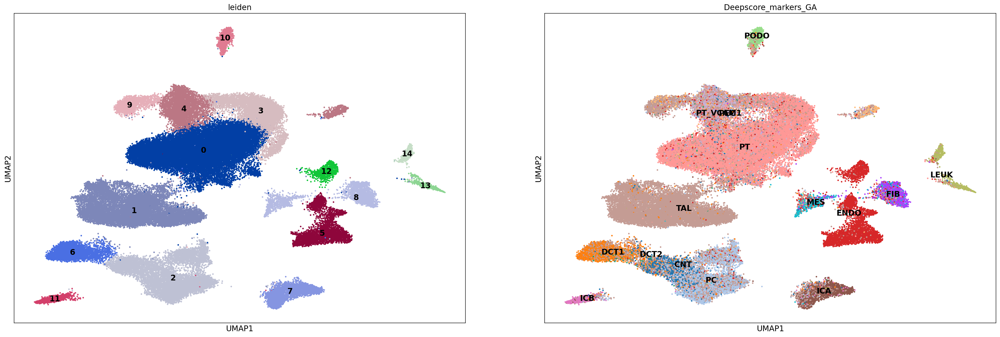

In [104]:
sc.pl.umap(adata, color=["leiden",'Deepscore_markers_GA'], legend_loc="on data", size = 30)

In [106]:
adata.obs['celltype'] = ''

In [107]:
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['0'])],'celltype'] = 'PT'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['1'])],'celltype'] = 'TAL'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['2'])],'celltype'] = 'PC_CNT'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['3'])],'celltype'] = 'PT'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['4'])],'celltype'] = 'PT_VCAM1_PEC'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['5'])],'celltype'] = 'ENDO'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['6'])],'celltype'] = 'DCT1'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['7'])],'celltype'] = 'ICA'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['8'])],'celltype'] = 'FIB_MES'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['9'])],'celltype'] = 'TL'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['10'])],'celltype'] = 'PODO'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['11'])],'celltype'] = 'ICB'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['12'])],'celltype'] = 'ENDO'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['13'])],'celltype'] = 'LEUK'
adata.obs.loc[adata.obs.index[adata.obs['leiden'].isin(['14'])],'celltype'] = 'LEUK'

In [112]:
adata_subset = adata[adata.obs['celltype'].isin(['FIB_MES'])].copy()


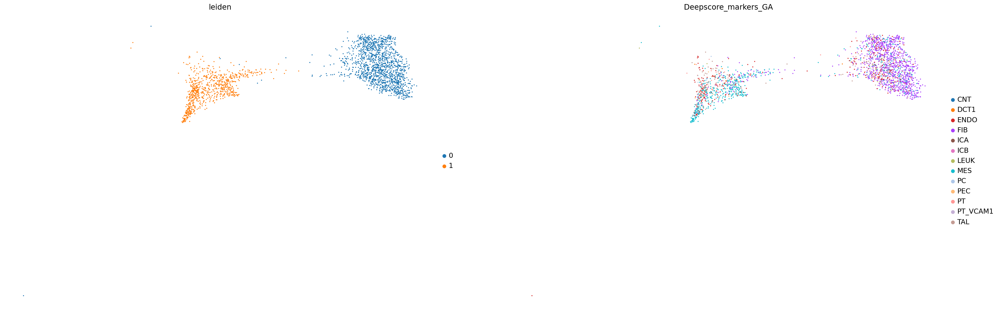

In [114]:
sc.tl.leiden(adata_subset, resolution = 0.1)
# sc.settings.set_figure_params(figsize=('10', '10'), color_map='gist_earth')
sc.pl.umap(adata_subset, color = ['leiden','Deepscore_markers_GA'], frameon=False, size = 15)

In [115]:
adata_subset.obs['celltype'] = ''

In [116]:
adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['0'])],'celltype'] = 'FIB'
adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['1'])],'celltype'] = 'MES'
# adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['2'])],'celltype'] = 'PC'
# adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['3'])],'celltype'] = 'PC'

In [117]:
adata.obs['celltype'] = adata.obs['celltype'].tolist()
adata.obs.loc[adata_subset.obs.index,'celltype']=adata_subset.obs['celltype']

In [118]:
adata_subset = adata[adata.obs['celltype'].isin(['PT_VCAM1_PEC'])].copy()


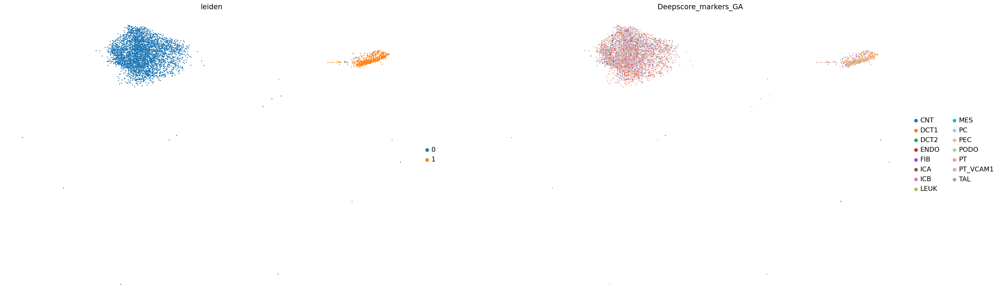

In [119]:
sc.tl.leiden(adata_subset, resolution = 0.1)
# sc.settings.set_figure_params(figsize=('10', '10'), color_map='gist_earth')
sc.pl.umap(adata_subset, color = ['leiden','Deepscore_markers_GA'], frameon=False, size = 15)

In [121]:
adata_subset.obs['celltype'] = ''

In [122]:
adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['0'])],'celltype'] = 'PT_VCAM1'
adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['1'])],'celltype'] = 'PEC'
# adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['2'])],'celltype'] = 'PC'
# adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['3'])],'celltype'] = 'PC'

In [123]:
adata.obs['celltype'] = adata.obs['celltype'].tolist()
adata.obs.loc[adata_subset.obs.index,'celltype']=adata_subset.obs['celltype']

In [124]:
adata_subset = adata[adata.obs['celltype'].isin(['PC_CNT'])].copy()


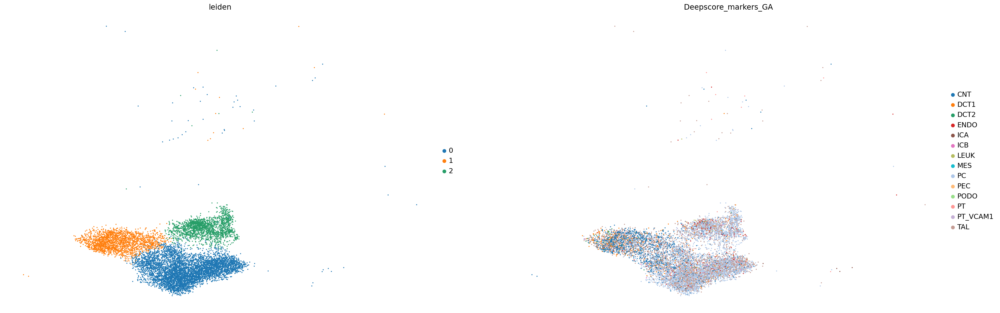

In [125]:
sc.tl.leiden(adata_subset, resolution = 0.1)
# sc.settings.set_figure_params(figsize=('10', '10'), color_map='gist_earth')
sc.pl.umap(adata_subset, color = ['leiden','Deepscore_markers_GA'], frameon=False, size = 15)

In [126]:
adata_subset.obs['celltype'] = ''

In [127]:
adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['0'])],'celltype'] = 'PC'
adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['1'])],'celltype'] = 'CNT'
adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['2'])],'celltype'] = 'PC'
# adata_subset.obs.loc[adata_subset.obs.index[adata_subset.obs['leiden'].isin(['3'])],'celltype'] = 'PC'

In [129]:
adata.obs['celltype'] = adata.obs['celltype'].tolist()
adata.obs.loc[adata_subset.obs.index,'celltype']=adata_subset.obs['celltype']

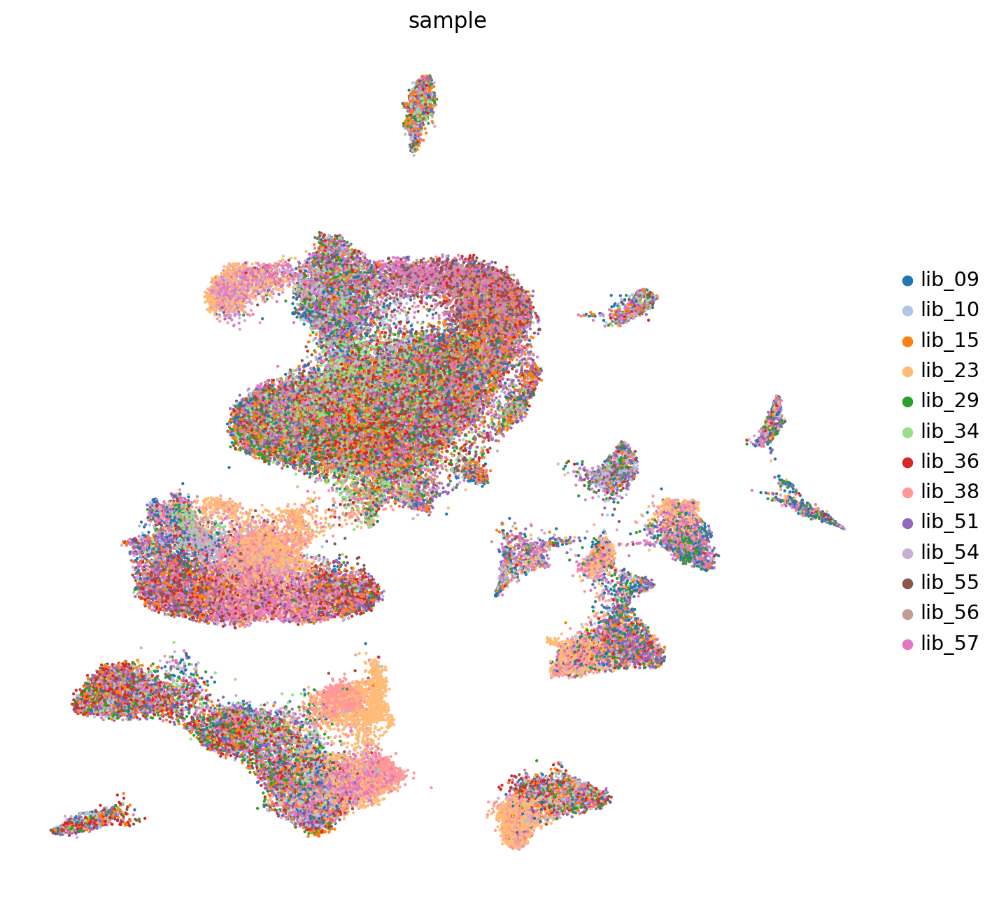

In [139]:
sc.pl.umap(adata, color = 'sample', frameon=False, size = 15, palette = sample_color_dic)

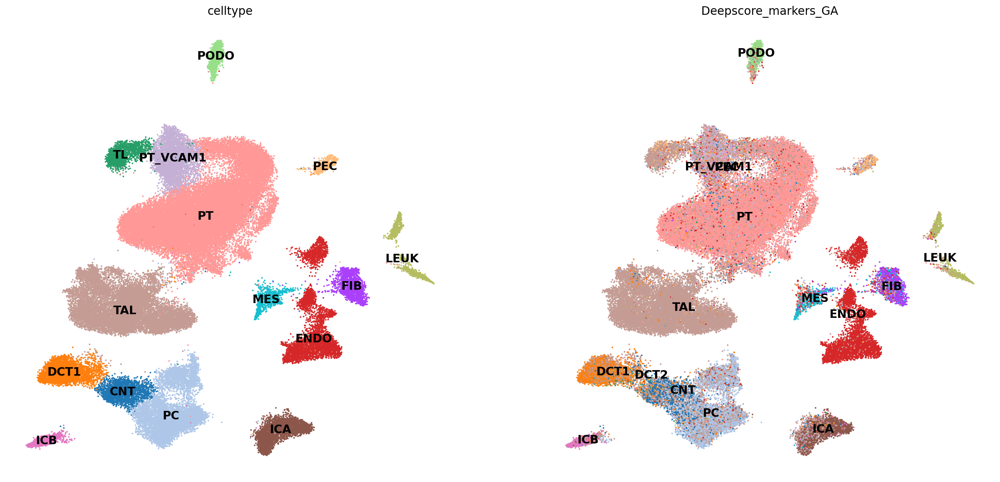

In [136]:
sc.settings.set_figure_params(figsize=('10', '10'), color_map='gist_earth')
sc.pl.umap(adata, color = ['celltype','Deepscore_markers_GA'], frameon=False, legend_loc='on data', size = 15, palette = palette)

## Load Peak Annotation and PLOT Marker Accessibility signals

In [ ]:
palette = { 'PT':'#ff9896',
 'PT_VCAM1':'#c5b0d5',
 'TL':'#279e68',
 'TAL':'#c49c94',
 'DCT1':'#ff7f0e',
 'CNT':'#1f77b4',
 'PC':'#aec7e8',
 'DCT2':'#279e68',
 'ENDO':'#d62728',
 'MES':'#17becf',
 'FIB':'#aa40fc',
 'ICA':'#8c564b',
 'ICB':'#e377c2',
 'PODO':'#98df8a',
 'PEC':'#ffbb78',
 'LEUK':'#b5bd61',
          }

In [ ]:
markers_dict = { 'Proximal Tubule Cell': ['LRP2', 'CUBN', 'SLC13A1','SLC5A12','SLC22A7','SLC22A6'],
                 'Adaptative Proximal Tubule Cell': ['ITGB8', 'DCDC2', 'TPM1','HAVCR1','KIF26B','ACSM3','DLGAP1','CDH6'],
                 'Thin Limb Cell': ['CRYAB', 'TACSTD2', 'SLC44A5', 'KLRG2', 'COL26A1', 'BOC'],
                 'Thick Ascending Limb Cell': ['CASR', 'SLC12A1', 'UMOD'],
                 'Distal Convoluted Tubule Cell': ['SLC12A3','CNNM2', 'FGF13', 'KLHL3', 'TRPM6'],
                 'Connecting Tubule': ['SLC8A1', 'SCN2A', 'HSD11B2', 'CALB1'],
                 'Principal Cell': ['GATA3', 'AQP2', 'AQP3'],
                 'Endothelial Cell': ['CD34', 'PECAM1', 'PTPRB', 'MEIS2', 'FLT1', 'EMCN'],
                 'Mesenglial':['PIP5K1B','ROBO1','DAAM2', 'PHTF2', 'POSTN'],
                 'Fibroblast': ['COL1A1', 'COL1A2', 'C7', 'NEGR1', 'FBLN5', 'DCN', 'CDH11'],
                 'Intercalated Cell A': ['SLC4A1', 'SLC26A7', 'CLNK'],
                 'Intercalated Cell B': ['SLC4A9', 'SLC35F3', 'SLC26A4', 'INSRR','TLDC2'],
                'Podocyte': ['PTPRQ', 'WT1', 'NPHS2','CLIC5', 'PODXL'],
                'Parietal Epithelial Cell': ['CLDN1', 'VCAM1', 'CFH', 'RBFOX1', 'ALDH1A2'],
                 'Immune Cells': ['PTPRC','PRKCB','ARHGAP15','MS4A1','CD96'],}


In [ ]:
markers_dict_ = { 'PT': ['LRP2', 'CUBN', 'SLC13A1','SLC5A12','SLC22A7','SLC22A6'],
                 'PT_VCAM1': ['ITGB8', 'DCDC2', 'TPM1','HAVCR1','KIF26B','ACSM3','DLGAP1','CDH6'],
                 'TL': ['CRYAB', 'TACSTD2', 'SLC44A5', 'KLRG2', 'COL26A1', 'BOC'],
                 'TAL': ['CASR', 'SLC12A1', 'UMOD'],
                 'DCT1': ['SLC12A3','CNNM2', 'FGF13', 'KLHL3', 'TRPM6'],
                 'CNT': ['SLC8A1', 'SCN2A', 'HSD11B2', 'CALB1'],
                 'PC': ['GATA3', 'AQP2', 'AQP3'],
                 'ENDO': ['CD34', 'PECAM1', 'PTPRB', 'MEIS2', 'FLT1', 'EMCN'],
                 'MES':['PIP5K1B','ROBO1','DAAM2', 'PHTF2', 'POSTN'],
                 'FIB':['COL1A1', 'COL1A2', 'C7', 'NEGR1', 'FBLN5', 'DCN', 'CDH11'],
                 'ICA': ['SLC4A1', 'SLC26A7', 'CLNK'],
                 'ICB': ['SLC4A9', 'SLC35F3', 'SLC26A4', 'INSRR','TLDC2'],
                'PODO': ['PTPRQ', 'WT1', 'NPHS2','CLIC5', 'PODXL'],
                'PEC': ['CLDN1', 'VCAM1', 'CFH', 'RBFOX1', 'ALDH1A2'],
                 'LEUK': ['PTPRC','PRKCB','ARHGAP15','MS4A1','CD96'],}

In [144]:
adata.obs['celltype'].unique().tolist()

['PT',
 'ICA',
 'PT_VCAM1',
 'DCT1',
 'FIB',
 'TAL',
 'PC',
 'ICB',
 'ENDO',
 'TL',
 'MES',
 'LEUK',
 'CNT',
 'PODO',
 'PEC']

In [ ]:
adata.obs['celltype'] = adata.obs['celltype'].cat.reorder_categories(list(palette.keys()))

In [173]:
ac.tl.add_peak_annotation(atac, annotation="~/Documents/CZI/MULTIOME/data/AGG/outs/atac_peak_annotation.tsv")

In [150]:
def flatten(lst):
    """Flatten a list recursively."""
    result = []
    for item in lst:
        if isinstance(item, list):
            result.extend(flatten(item))
        else:
            result.append(item)
    return result


my_list = []
for val in markers_dict.values():
    if isinstance(val, list):
        my_list.extend(flatten(val))
    else:
        my_list.append(val)

In [157]:
adata.uns["atac"]["peak_annotation"]

,peak,distance,peak_type
gene,,,
AL627309.5,chr1:181019-181792,-7158,distal
AL627309.5,chr1:191047-191897,-17186,distal
AC114498.1,chr1:629498-630394,41870,distal
AC114498.1,chr1:631150-632220,43522,distal
AC114498.1,chr1:633506-634827,45878,distal
...,...,...,...
AC213203.2,KI270713.1:15089-15884,16644,distal
AC213203.2,KI270713.1:21501-22436,10092,distal
AC213203.2,KI270713.1:26116-26828,5700,distal


In [160]:
for gene in my_list:
    if np.sum(adata.uns["atac"]["peak_annotation"].index.isin([gene]))==0:
        my_list.remove(gene)

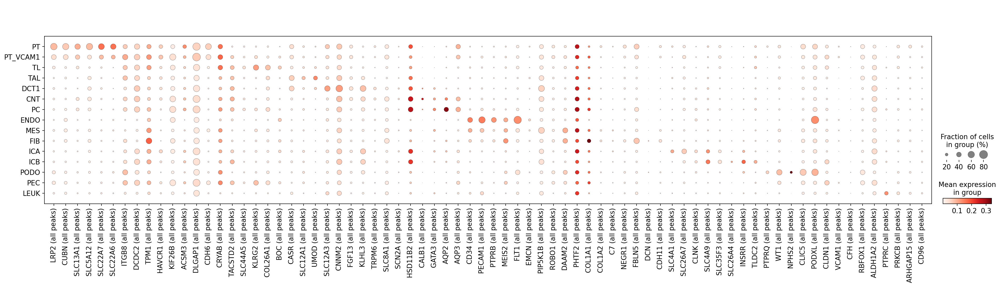

In [163]:
ac.pl.dotplot(atac,my_list, groupby='celltype',layer='counts')

In [ ]:
del adata.uns["atac"] ## Avoid bug while saving the object

In [ ]:
adata.write('objects/atac_FINAL.h5ad', compression='gzip')
adata.write('objects/atac.h5ad', compression='gzip')